# Suppose we are currently working as a Data Scientist for a magazine. The editor of the magazine requires our assistance to identify that on what topics the content has already been published. With the summarization, the editor will be able to identify additional subtopics where new content is required. So, we will be using topic modelling to determine the topics of the different content which has been already published in the magazine. 

# But, this time for performing topic modelling, we will be using Latent Dirichilet Allocation from Gensim Library. 

In [1]:
cd /content/drive/MyDrive

/content/drive/MyDrive


In [2]:
! unzip ./PolicyEthics.xlsx.zip

Archive:  ./PolicyEthics.xlsx.zip
  inflating: Policy  Ethics.xlsx     


### To know more about the dataset, you can navigate to the following url: 

https://www.kaggle.com/husamal/scientificamerican

### Furthermore, we will select the Policy and Ethics dataset to work on as it has got the maximum number of magazine articles. 

In [3]:
# Load the Policy and Ethics Dataset from Scientific American Magazine
import pandas as pd

In [4]:
data = pd.read_excel('./PolicyEthics.xlsx', sheet_name='Sheet1')

data.head()

,articleText,title
0,The first charge of a state governor should be...,Andrew Cuomo Should Resign
1,Editor’s Note (3/3/21): The shocking recent bl...,Green Alternative to Border Wall Might Have Sa...
2,The long-anticipated CDC guidance on schools w...,Science and Society Are Failing Children in th...
3,Like many low-wage restaurant workers in Bosto...,It’s a Myth That Asian-Americans Are Doing Wel...
4,When Joe Biden was sworn in as the 46th U.S. p...,Biden Must Take Immediate Action to Reduce the...


In [5]:
import spacy
import en_core_web_sm
from spacy.lang.en.stop_words import STOP_WORDS

In [6]:
# Create a custom stop words list
spacy_nlp = spacy.load('en')

# Add custom stopwords to Spacy
spacy_nlp.Defaults.stop_words |= {'..','...','....','.....','phone', 'good','great','nice'}

In [7]:
# Create a custom tokenizer that uses spacy
def tokenizer(articles):
    processed_articles = []
    for doc in spacy_nlp.pipe(articles, batch_size=32, n_process=2, disable=["parser", "ner"]):

      # Remove stop words, punctuation and numbers
      # Return the lemma of the word as lowercase and remove extra spaces
     # Add your code here

      processed_articles.append(tokens)
    return processed_articles

In [8]:
# Convert the 'articleText' column to a list of documents
articles = data['articleText'].astype(str).tolist()
print(len(articles))

14896


In [9]:
articles

["The first charge of a state governor should be to keep as many of their constituents alive as possible, especially during times of crisis. In collusion with a fawning news media (which includes his own brother, CNN anchor Chris Cuomo), Governor Andrew Cuomo of New York has failed to do this.Indeed, the COVID pandemic has proven that he does not respect nor perhaps even understand scientific knowledge enough to avoid needlessly letting thousands of New Yorkers die—and he should resign immediately.It was strange to me when sycophants in the press nicknamed Cuomo “America’s governor” last year. (Then again, the press dubbed Rudy Giuliani “America’s mayor” after 9/11, even as he tried to subvert election law, and look at how that hagiography has held up over time.) In March 2020, after the toll of COVID in Wuhan, China and Lombardi, Italy were well-known, New York City Mayor Bill de Blasio wanted a shelter-in-place order within 48 hours. But Cuomo dismissively said, “It cannot happen leg

In [10]:
processed_articles = tokenizer(articles)

In [11]:
# Create a dictionary and a Document to Word Matrix
from gensim import corpora

# Add your code here

bag_of_words_representation = [dictionary.doc2bow(text) for text in processed_articles]

In [12]:
bag_of_words_representation[0]

[(0, 1),
 (1, 2),
 (2, 1),
 (3, 1),
 (4, 5),
 (5, 1),
 (6, 1),
 (7, 1),
 (8, 1),
 (9, 2),
 (10, 1),
 (11, 5),
 (12, 1),
 (13, 2),
 (14, 4),
 (15, 1),
 (16, 1),
 (17, 1),
 (18, 1),
 (19, 1),
 (20, 1),
 (21, 1),
 (22, 1),
 (23, 1),
 (24, 1),
 (25, 1),
 (26, 1),
 (27, 1),
 (28, 1),
 (29, 4),
 (30, 1),
 (31, 1),
 (32, 1),
 (33, 1),
 (34, 1),
 (35, 2),
 (36, 1),
 (37, 1),
 (38, 1),
 (39, 1),
 (40, 1),
 (41, 4),
 (42, 4),
 (43, 1),
 (44, 1),
 (45, 1),
 (46, 1),
 (47, 1),
 (48, 1),
 (49, 1),
 (50, 1),
 (51, 2),
 (52, 4),
 (53, 1),
 (54, 1),
 (55, 4),
 (56, 1),
 (57, 1),
 (58, 1),
 (59, 1),
 (60, 1),
 (61, 1),
 (62, 1),
 (63, 1),
 (64, 1),
 (65, 1),
 (66, 1),
 (67, 1),
 (68, 1),
 (69, 1),
 (70, 1),
 (71, 1),
 (72, 1),
 (73, 10),
 (74, 3),
 (75, 1),
 (76, 3),
 (77, 1),
 (78, 1),
 (79, 23),
 (80, 1),
 (81, 1),
 (82, 6),
 (83, 2),
 (84, 2),
 (85, 1),
 (86, 6),
 (87, 4),
 (88, 1),
 (89, 1),
 (90, 1),
 (91, 1),
 (92, 1),
 (93, 2),
 (94, 2),
 (95, 1),
 (96, 1),
 (97, 4),
 (98, 1),
 (99, 1),
 (100, 1

In [13]:
# Apply the Gensim LDA Topic Modeling Algorithm
import gensim

num_topics = 64
ldamodel = gensim.models.ldamodel.LdaModel(bag_of_words_representation, num_topics = num_topics, id2word=dictionary)

### Let's now use pyLDAvis to Visualize Generated Topics

In [15]:
! pip install pyLDAvis

     |████████████████████████████████| 1.7 MB 5.2 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
  Created wheel for pyLDAvis: filename=pyLDAvis-3.3.1-py2.py3-none-any.whl size=136898 sha256=d698d54ea20dced34358ba6dd0192fd27c621e83327eded360ab1e139438add3
  Stored in directory: /root/.cache/pip/wheels/c9/21/f6/17bcf2667e8a68532ba2fbf6d5c72fdf4c7f7d9abfa4852d2f
Successfully built pyLDAvis


In [16]:
import pyLDAvis

/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Iterable


In [17]:
pyLDAvis.enable_notebook()

In [18]:
from pyLDAvis import gensim_models

In [19]:
vis = gensim_models.prepare(ldamodel,bag_of_words_representation,dictionary=dictionary)

/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  by='saliency', ascending=False).head(R).drop('saliency', 1)


In [20]:
vis

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
16    -0.149891  0.116201       1        1  6.206142
59     0.119999  0.096393       2        1  5.223135
11     0.084505  0.066548       3        1  4.969336
29    -0.093962 -0.099559       4        1  4.573964
13     0.178638 -0.042605       5        1  3.837199
...         ...       ...     ...      ...       ...
25    -0.060365  0.042845      60        1  0.226810
10    -0.007508  0.079106      61        1  0.220312
32    -0.003805  0.052583      62        1  0.184117
60    -0.004676 -0.111367      63        1  0.130471
46    -0.054540  0.047965      64        1  0.046164

[64 rows x 5 columns], topic_info=                 Term          Freq         Total Category  logprob  loglift
2236             cell  10803.000000  10803.000000  Default  30.0000  30.0000
673             child   6361.000000   6361.000000  Default  29.0000  29.0000
763              food   6998.000000   6998.000000  Default  28.0000  28.0000
391          chemical   4917.000000   4917.000000  Default  27.0000  27.0000
3162           cancer   4138.000000   4138.000000  Default  26.0000  26.0000
...               ...           ...           ...      ...      ...      ...
18701       honeycomb      5.333644     20.775323  Topic64  -5.9099   6.3210
7730         swimming      6.876169    119.924909  Topic64  -5.6558   4.8219
2895             noaa      9.053496    645.221466  Topic64  -5.3807   3.4143
4      administration      9.647385   4365.875717  Topic64  -5.3172   1.5658
158             house      6.428949   4091.800763  Topic64  -5.7231   1.2248

[4414 rows x 6 columns], token_table=       Topic      Freq         Term
term                               
17221     23  0.906891        "here
18285     14  0.892315       "image
18285     41  0.065491       "image
18285     45  0.040932       "image
18243     14  0.934439  "researcher
...      ...       ...          ...
18150     46  0.011241            ®
18150     49  0.022481            ®
18905     30  0.035952        ”note
18905     47  0.862857        ”note
18905     53  0.071905        ”note

[57967 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[17, 60, 12, 30, 14, 15, 45, 1, 27, 10, 2, 49, 34, 51, 13, 22, 42, 31, 6, 24, 8, 54, 53, 40, 44, 20, 43, 19, 62, 4, 23, 59, 41, 46, 64, 25, 38, 32, 52, 16, 50, 35, 37, 29, 56, 18, 7, 57, 55, 21, 36, 48, 5, 28, 3, 58, 9, 63, 39, 26, 11, 33, 61, 47])

### Let's create a function to display each topic as a word cloud

In [21]:
topic_words_freq = ldamodel.show_topic(1, topn=32)
print(topic_words_freq)
dict(topic_words_freq)

[('oil', 0.018124022), ('nuclear', 0.016290123), ('plant', 0.008151592), ('site', 0.007995752), ('waste', 0.006589146), ('radiation', 0.005304846), ('radioactive', 0.0048977504), ('ship', 0.004450179), ('meter', 0.0042397315), ('facility', 0.004121897), ('fukushima', 0.0036140129), ('mile', 0.0035634323), ('drill', 0.0034876645), ('drilling', 0.0033080373), ('deep', 0.0032732612), ('near', 0.0032201132), ('fuel', 0.003146763), ('spill', 0.0031399243), ('cool', 0.0027614206), ('well', 0.0027345535), ('pipe', 0.002687422), ('pump', 0.0026284286), ('safety', 0.0026184309), ('barrel', 0.0026170262), ('japan', 0.0025653625), ('accident', 0.0025647555), ('turtle', 0.002503756), ('operation', 0.002455016), ('gas', 0.0024436712), ('island', 0.0024413858), ('flow', 0.002405888), ('bp', 0.0023765701)]


{'accident': 0.0025647555,
 'barrel': 0.0026170262,
 'bp': 0.0023765701,
 'cool': 0.0027614206,
 'deep': 0.0032732612,
 'drill': 0.0034876645,
 'drilling': 0.0033080373,
 'facility': 0.004121897,
 'flow': 0.002405888,
 'fuel': 0.003146763,
 'fukushima': 0.0036140129,
 'gas': 0.0024436712,
 'island': 0.0024413858,
 'japan': 0.0025653625,
 'meter': 0.0042397315,
 'mile': 0.0035634323,
 'near': 0.0032201132,
 'nuclear': 0.016290123,
 'oil': 0.018124022,
 'operation': 0.002455016,
 'pipe': 0.002687422,
 'plant': 0.008151592,
 'pump': 0.0026284286,
 'radiation': 0.005304846,
 'radioactive': 0.0048977504,
 'safety': 0.0026184309,
 'ship': 0.004450179,
 'site': 0.007995752,
 'spill': 0.0031399243,
 'turtle': 0.002503756,
 'waste': 0.006589146,
 'well': 0.0027345535}

In [22]:
! pip install wordcloud

Topic  1


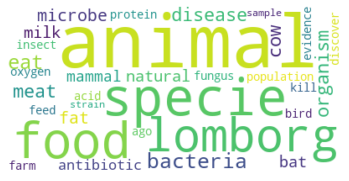

Topic  2


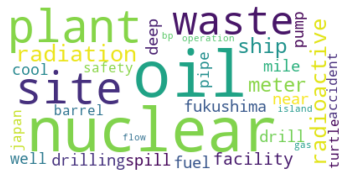

Topic  3


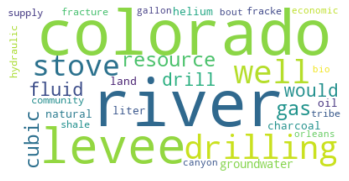

Topic  4


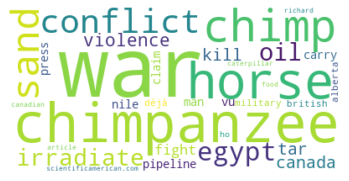

Topic  5


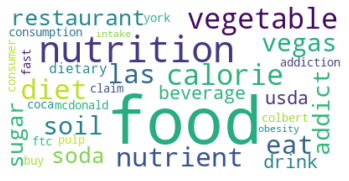

Topic  6


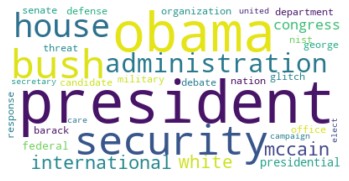

Topic  7


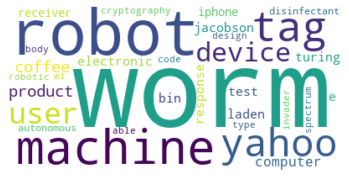

Topic  8


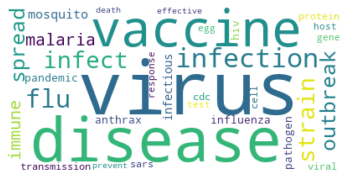

Topic  9


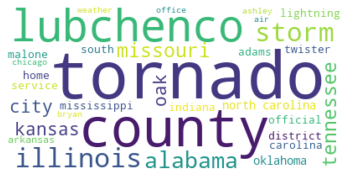

Topic  10


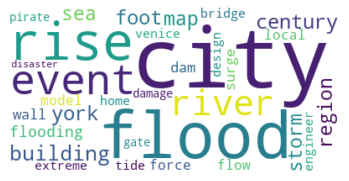

Topic  11


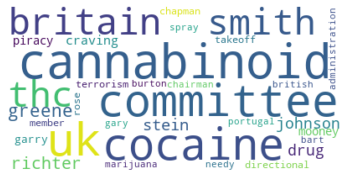

Topic  12


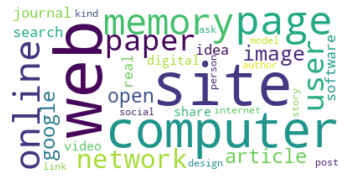

Topic  13


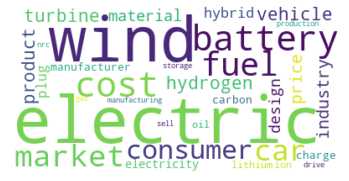

Topic  14


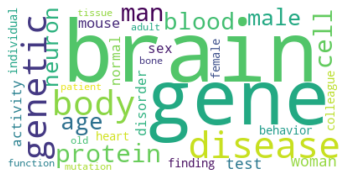

Topic  15


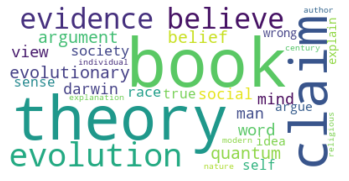

Topic  16


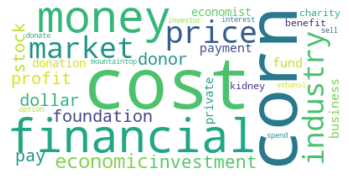

Topic  17


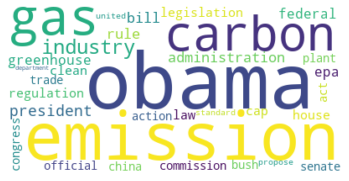

Topic  18


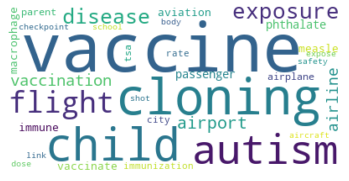

Topic  19


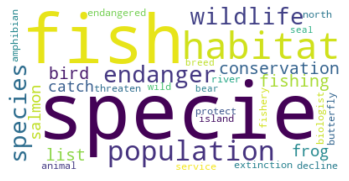

Topic  20


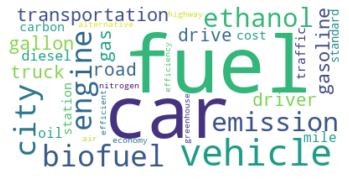

Topic  21


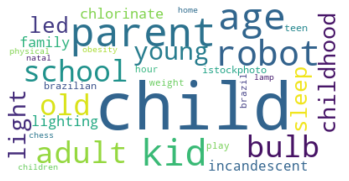

Topic  22


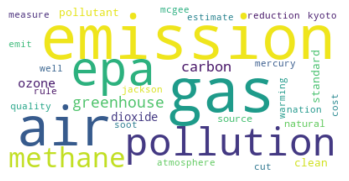

Topic  23


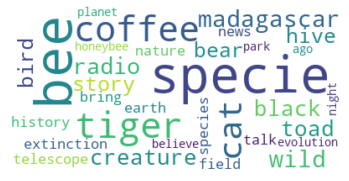

Topic  24


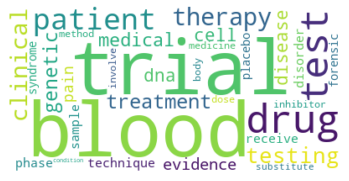

Topic  25


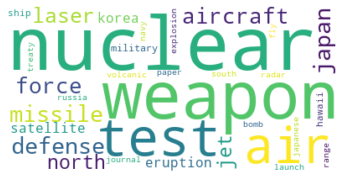

Topic  26


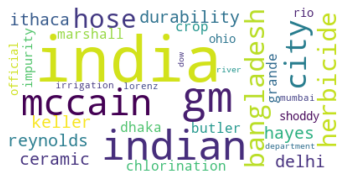

Topic  27


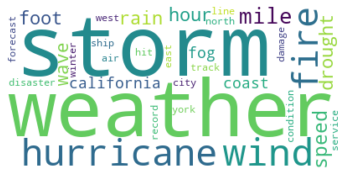

Topic  28


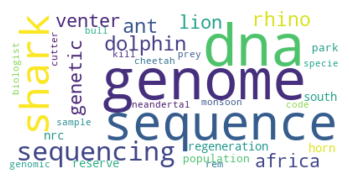

Topic  29


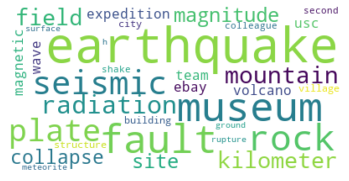

Topic  30


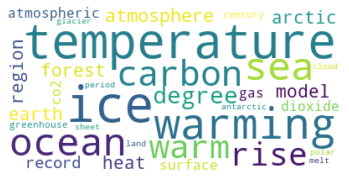

Topic  31


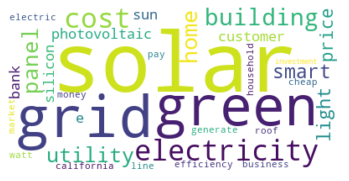

Topic  32


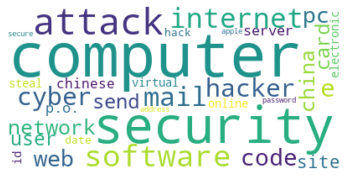

Topic  33


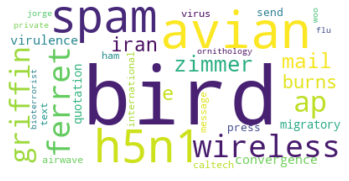

Topic  34


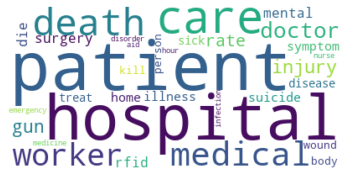

Topic  35


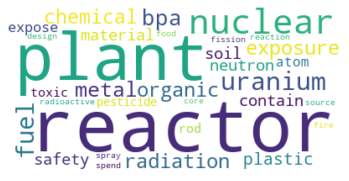

Topic  36


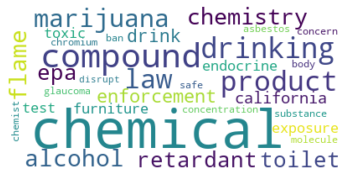

Topic  37


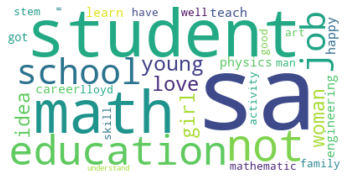

Topic  38


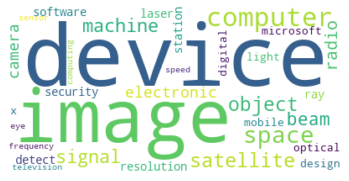

Topic  39


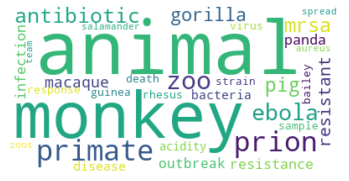

Topic  40


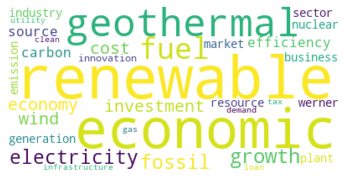

Topic  41


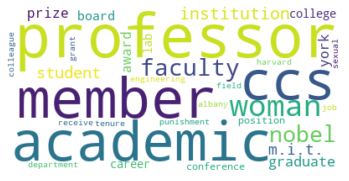

Topic  42


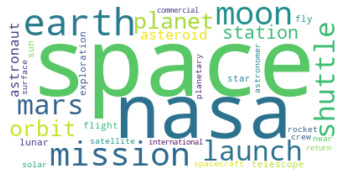

Topic  43


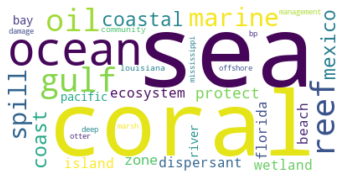

Topic  44


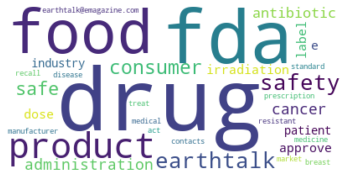

Topic  45


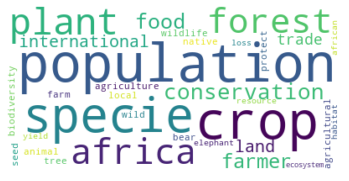

Topic  46


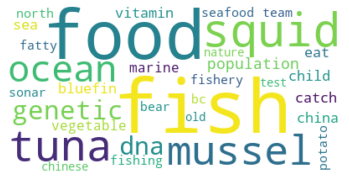

Topic  47


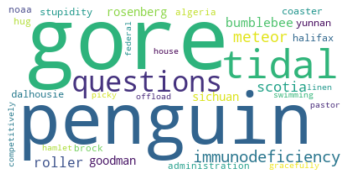

Topic  48


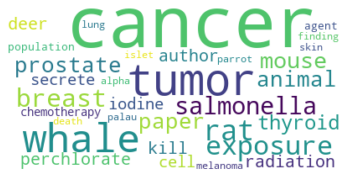

Topic  49


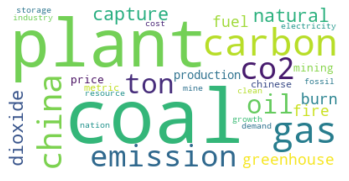

Topic  50


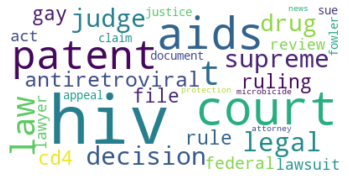

Topic  51


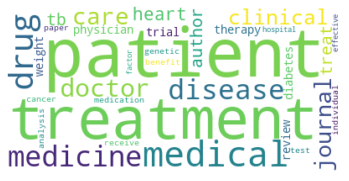

Topic  52


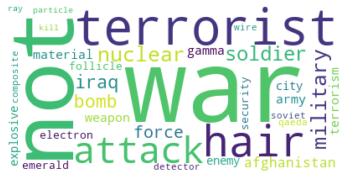

Topic  53


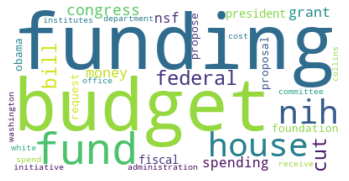

Topic  54


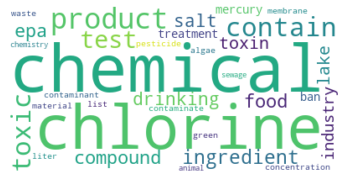

Topic  55


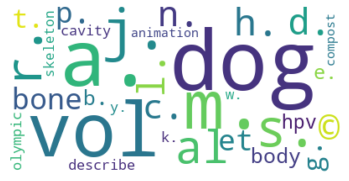

Topic  56


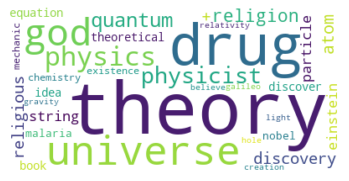

Topic  57


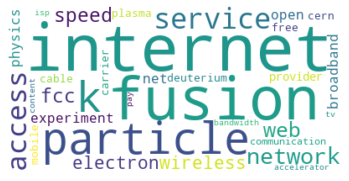

Topic  58


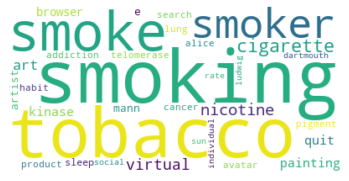

Topic  59


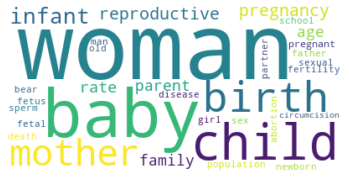

Topic  60


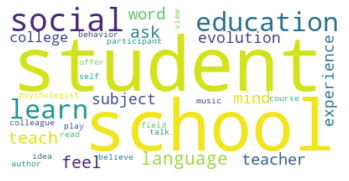

Topic  61


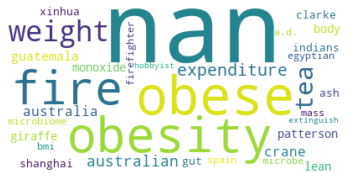

Topic  62


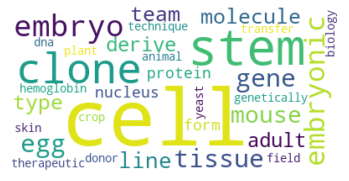

Topic  63


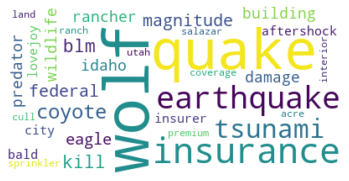

Topic  64


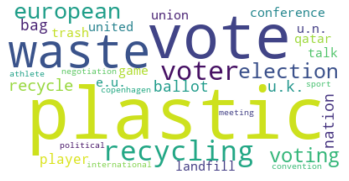

In [25]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

#Generate topic word clouds
topic_number = 0 # Initialize counter
while topic_number < num_topics:
    topic_words_freq = dict(ldamodel.show_topic(topic_number, topn=32))
    #print(topic_words_freq)
    topic_number += 1    
    print("Topic ", topic_number)
    # Generate Word Cloud for topic using frequencies
    wordcloud = WordCloud(background_color="white").generate_from_frequencies(topic_words_freq) 
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

### Let's create a function to display the top documents or articles in a topic 

In [24]:
def get_document_topics_df(ldamodel, corpus):
  topic_probabilities = ldamodel.get_document_topics(corpus) 
  topic_dict = [dict(i) for i in topic_probabilities] 
  df = pd.DataFrame(topic_dict).fillna(0) 
  return df

In [29]:
def get_top_five_documents_for_topic(document_topics_df, articles, topic_number, num_docs=5):
  top_five_doc_indexes = document_topics_df[topic_number].argsort(axis=1)[::-1][:num_docs]
  print('Topic ', topic_number)
  for doc_idx in top_five_doc_indexes:
    print(articles[doc_idx])
  print('----')

In [30]:
document_topics_df = get_document_topics_df(ldamodel, bag_of_words_representation)
get_top_five_documents_for_topic(document_topics_df, articles, 0, num_docs=5)

Topic  0
There are bacteria in wine that may be beneficial for people's health, new research finds.In the study, researchers in Spain isolated 11 strains of bacteria from wine, including strains of Lactobacillus, which are also found in yogurt, as well as Oenococcus and Pediococcus bacteria, which are associated with the wine-making process."Up to now, many studies have reported that the best [foods] to deliver probiotics are dairy fermented products, so that the probiotic properties of wine-related [Lactobacillus] were hardly studied," said study author Dolores González de Llano of Universidad Autónoma de Madrid in Spain.But "nowadays, there is a need for novel and nondairy probiotics, from the increasing number of lactose-intolerance cases occurring in the world population, coupled with the unfavorable effect of cholesterol contained in fermented dairy products," González de Llano told Live Science. [Don't Be Fooled: 5 Probiotics Myths]Probiotics are live organisms that can bring hea

### Let's perform dimensionality reduction to create a 2D spatial scatter splot of all the documents. 

In [31]:
! pip install bokeh

In [32]:
documents_topics_matrix = document_topics_df.to_numpy()

In [33]:
documents_topics_matrix.shape

(14896, 64)

In [34]:
from sklearn.manifold import TSNE
from bokeh.io import output_notebook
from bokeh.plotting import figure, show
from bokeh.models import HoverTool, CustomJS, ColumnDataSource, Slider
from bokeh.layouts import column
from bokeh.palettes import all_palettes, magma

In [35]:
output_notebook()

In [36]:
tsne = TSNE(n_components=2, random_state=2021, n_jobs=2)
dim_reduced_embedding = tsne.fit_transform(documents_topics_matrix)
dim_reduced_embedding = pd.DataFrame(dim_reduced_embedding, columns=['x','y'])
dim_reduced_embedding['hue'] = documents_topics_matrix.argmax(axis=1)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


In [37]:
dim_reduced_embedding

,x,y,hue
0,-9.897116,14.575281,8
1,35.595810,19.916353,17
2,-6.875239,-1.774415,22
3,16.643866,15.078478,13
4,26.358442,-27.306282,1
...,...,...,...
14891,-4.072211,62.379116,29
14892,-30.052254,-32.788593,27
14893,-12.197287,-30.327450,27
14894,-17.413321,42.888947,33


In [38]:
color_list = magma(num_topics)

source = ColumnDataSource(
        data=dict(
            x = dim_reduced_embedding.x,
            y = dim_reduced_embedding.y,
            colors = [color_list[i] for i in dim_reduced_embedding.hue],
            text = data['title'].head(300),
            alpha = [0.9] * dim_reduced_embedding.shape[0],
            size = [7] * dim_reduced_embedding.shape[0]
        )
    )
hover_tsne = HoverTool(names=["data"], tooltips="""
    <div style="margin: 10">
        <div style="margin: 0 auto; width:300px;">
            <span style="font-size: 12px; font-weight: bold;">Review:</span>
            <span style="font-size: 12px">@text</span>
        </div>
    </div>
    """)
tsne_tools = [hover_tsne, 'pan', 'wheel_zoom', 'reset']
tsne_plot = figure(plot_width=700, plot_height=700, tools=tsne_tools, title='Policy and Ethics Articles Topics')
tsne_plot.circle('x', 'y', size='size', alpha='alpha', fill_color='colors', line_alpha=0, line_width=0.01, source=source, name="data") 

layout = column(tsne_plot)
show(layout)